# Image Preprocessing

In [ ]:
!pip install opencv-python

In [ ]:
import cv2 ''
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [ ]:
from google.colab import drive

drive.mount('/content/gdrive/', force_remount=True)

Mounted at /content/gdrive/


In [ ]:
# save_path = './output_cv2'
# if not os.path.exists(save_path):
#     os.makedirs(save_path)

In [ ]:
!ls /content/gdrive/MyDrive/dataset/bottle2/

B10_20221115_000157.jpg  B9_20221104_004669.jpg  B9_20221104_004672.jpg
B10_20221115_000243.jpg  B9_20221104_004670.jpg  B9_20221104_004674.jpg
B10_20221115_000805.jpg  B9_20221104_004671.jpg


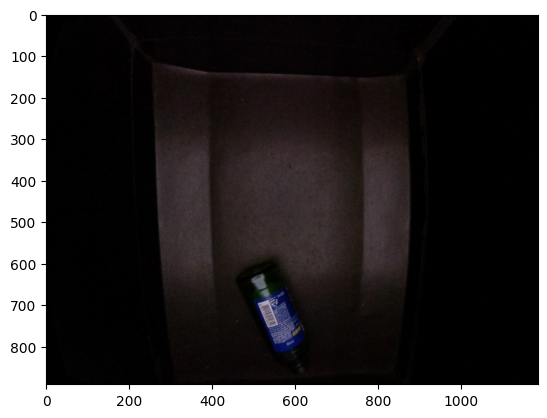

In [ ]:
image_path = '/content/gdrive/MyDrive/dataset/bottle2/B10_20221115_000157.jpg'
image = mpimg.imread(image_path)
plt.imshow(image)
plt.show()

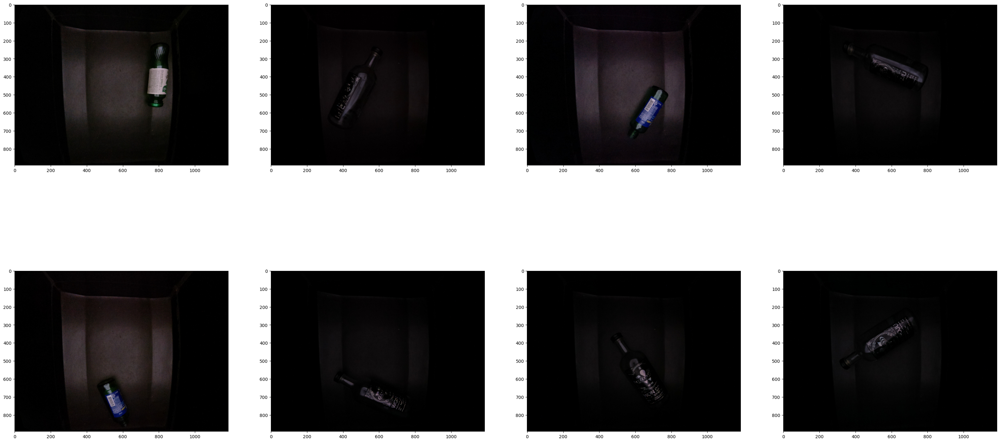

In [ ]:
path = '/content/gdrive/MyDrive/dataset/bottle2'
fig = plt.figure(figsize=(40, 20))
for idx, f in enumerate(os.listdir(path)):
  image_path = os.path.join(path, f)
  image = mpimg.imread(image_path)
  fig.add_subplot(2, 4, idx+1)
  plt.imshow(image)
plt.show()

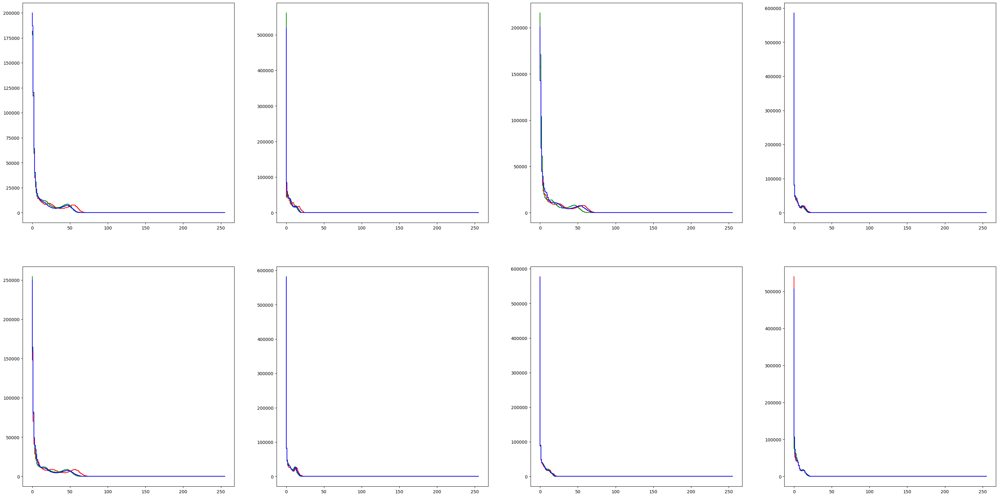

In [ ]:
fig = plt.figure(figsize=(40, 20))
for idx, f in enumerate(os.listdir(path)):
  image_path = os.path.join(path, f)
  image = mpimg.imread(image_path)
  ax = fig.add_subplot(2, 4, idx+1)
  for channel, color in enumerate('rgb'):  
    array = np.array(image)
    channel_values = array[:, :, channel]
    bincount = np.bincount(channel_values.flatten(), minlength=256)
    #print('bincount', bincount)
    ax.step(np.arange(256), bincount, c=color)
plt.show()    

In [ ]:
save_path = '/content/gdrive/MyDrive/dataset/sample_cv2'

def run_histogram_equalization(image_path):
    bgr_img = cv2.imread(image_path)
    rgb_image = cv2.cvtColor(bgr_img, cv2.COLOR_BGR2RGB)

    rgb_image[:, :, 0] = cv2.equalizeHist(rgb_image[:, :, 0])
    rgb_image[:, :, 1] = cv2.equalizeHist(rgb_image[:, :, 1])
    rgb_image[:, :, 2] = cv2.equalizeHist(rgb_image[:, :, 2])
    return rgb_image
    #image_path = os.path.join(save_path, file)
    #cv2.imwrite(image_path, rgb_image)

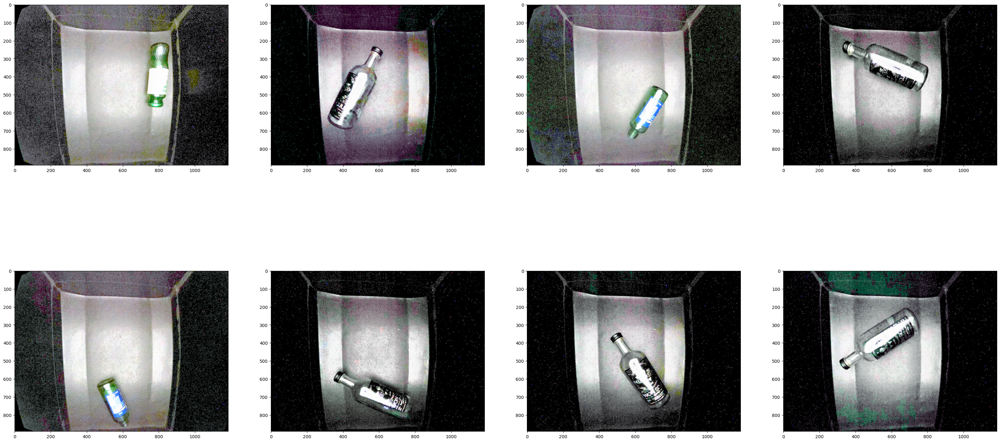

In [ ]:
path = '/content/gdrive/MyDrive/dataset/bottle2'
fig = plt.figure(figsize=(40, 20))
for idx, f in enumerate(os.listdir(path)):
  image_path = os.path.join(path, f)
  image = run_histogram_equalization(image_path)
  #image = mpimg.imread(image_path)
  fig.add_subplot(2, 4, idx+1)
  plt.imshow(image)
plt.show()

In [ ]:
def image_preprocessing(image_path):
    bgr_img = cv2.imread(image_path)

    # Step 1: Image Correction using Histogram Equalization
    img_rgb = cv2.cvtColor(bgr_img, cv2.COLOR_BGR2RGB)

    # Equalize the histogram of the Y channel
    img_rgb[:,:,0] = cv2.equalizeHist(img_rgb[:,:,0])
    img_rgb[:,:,1] = cv2.equalizeHist(img_rgb[:,:,1])
    img_rgb[:,:,2] = cv2.equalizeHist(img_rgb[:,:,2])

    # Convert the YUV image back to RGB format
    #image = cv2.cvtColor(img_rgb, cv2.COLOR_YUV2BGR)

    # Step 2: Gamma Correction
    #gamma = 0.8  # More than 1 brightens the image, less than 1 darkens.
    #corrected_image = np.array(255*(img_rgb / 255) ** gamma, dtype = 'uint8')

    # Step 3: Color Balance (Simplest approach is to convert image to gray scale)
    #gray_image = cv2.cvtColor(corrected_image, cv2.COLOR_RGB2GRAY)

    # Step 4: Noise Reduction using Gaussian Blur
    smooth_image = cv2.GaussianBlur(img_rgb, (5, 5), 0)

    return smooth_image

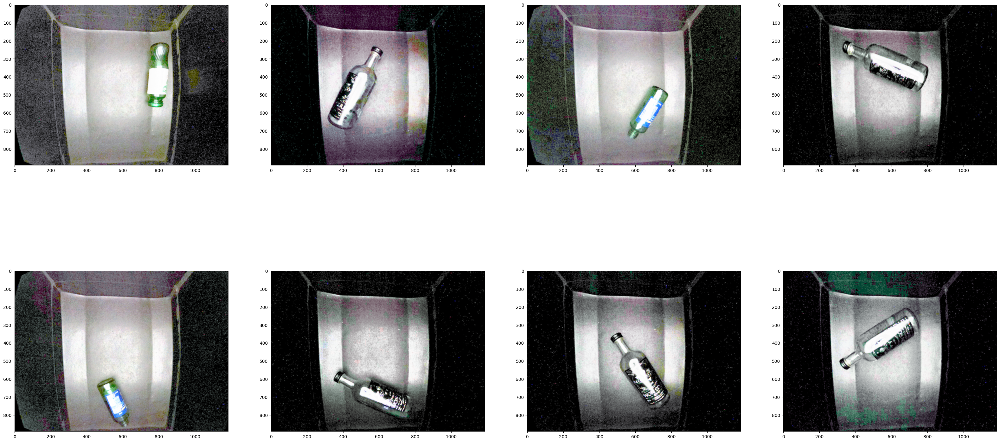

In [ ]:
path = '/content/gdrive/MyDrive/dataset/bottle2'
fig = plt.figure(figsize=(40, 20))
for idx, f in enumerate(os.listdir(path)):
  image_path = os.path.join(path, f)
  image = image_preprocessing(image_path)
  #image = mpimg.imread(image_path)
  fig.add_subplot(2, 4, idx+1)
  plt.imshow(image)
plt.show()

 https://github.com/danielgatis/rembg

# Image Sampling

In [ ]:
# All Training set
# defaultdict(<class 'int'>, {
#   'TL_A1_1': 498, 
#   'TL_A2_1': 4, 
#   'TL_A3_1': 4, 
#   'TL_A4_1': 400, 
#   'TL_A5_1': 94, 
#   'TL_A6_1': 39, 
#   'TL_A7_1': 9, 
#   'TL_A8_1': 197, 
#   'TL_A9_1': 111, 
#   'TL_B1_1': 9667, 
#   'TL_B2_1': 1, 
#   'TL_B3_1': 2061, 
#   'TL_B4_1': 753, 
#   'TL_B5_1': 307, 
#   'TL_B6_1': 5623, 
#   'TL_B7_1': 5330, 
#   'TL_B8_1': 1487, 
#   'TL_B9_1': 3386, 
#   'TL_B10_1': 3356, 
#   'TL_C1_1': 40027
# }
# )

# defaultdict(<class 'int'>, {
#     'c_4_03': 7783, 
#     'c_4_02_03_01': 10412, 
#     'c_4_02_01_01': 11360, 
#     'c_4_02_03_02': 5670, 
#     'c_4_03_01': 5442, 
#     'c_4_02_02_01': 6980, 
#     'c_4_01_01': 7334, 
#     'c_4_02_01_02': 7003, 
#     'c_4_01_02': 5976, 
#     'c_4_02_02_02': 5394
# }
# )

In [ ]:
import json
import os
import shutil
from collections import defaultdict

root_path = './dataset/'
root_image_path = './dataset/bottle_image'
root_label_path = './dataset/bottle_label'
labels_dir = ['TL_A1_1', 'TL_A2_1', 'TL_A3_1', 'TL_A4_1', 'TL_A5_1', 'TL_A6_1', 'TL_A7_1', 'TL_A8_1', 'TL_A9_1',
          'TL_B1_1', 'TL_B2_1', 'TL_B3_1', 'TL_B4_1', 'TL_B5_1', 'TL_B6_1', 'TL_B7_1', 'TL_B8_1', 'TL_B9_1', 'TL_B10_1',
          'TL_C1_1'
              ]

label_dir_2_image_dir = {
    'TL_A1_1': 'TS_A1',
    'TL_A2_1': 'TS_A2',
    'TL_A3_1': 'TS_A3',
    'TL_A4_1': 'TS_A4',
    'TL_A5_1': 'TS_A5',
    'TL_A6_1': 'TS_A6',
    'TL_A7_1': 'TS_A7',
    'TL_A8_1': 'TS_A8',
    'TL_A9_1': 'TS_A9',
    'TL_B1_1': 'TS_B1',
    'TL_B2_1': 'TS_B2',
    'TL_B3_1': 'TS_B3',
    'TL_B4_1': 'TS_B4',
    'TL_B5_1': 'TS_B5',
    'TL_B6_1': 'TS_B6',
    'TL_B7_1': 'TS_B7',
    'TL_B8_1': 'TS_B8',
    'TL_B9_1': 'TS_B9',
    'TL_B10_1': 'TS_B10',
    'TL_C1_1': 'TS_C1',
}

bottle_labels = ['c_4_01_02', 'c_4_02_01_02', 'c_4_02_02_02', 'c_4_02_03_02', 'c_4_03',
                 'c_4_03_01', 'c_4_01_01', 'c_4_02_01_01', 'c_4_02_02_01', 'c_4_02_03_01',
                 ]

b_labels2text = {'c_4_01_02': '재사용 유리 (소주병+맥주병)',
                 'c_4_02_01_02': '갈색 유리',
                 'c_4_02_02_02': '녹색 유리',
                 'c_4_02_03_02': '백색 유리',
                 'c_4_03': '기타 유리',
                 'c_4_03_01': '기타유리 + 이물질',
                 'c_4_01_01': '재사용 유리 (소주병+맥주병) + 다중포장재',
                 'c_4_02_01_01': '갈색 유리 + 다중포장재',
                 'c_4_02_02_01': '녹색 유리 + 다중포장재 ',
                 'c_4_02_03_01': '백색 유리 + 다중포장재',
                 }

bottle_label_count = defaultdict(int)
labels_dir_count = defaultdict(int)


def get_label_path(label_dir):
    return os.path.join(root_label_path, label_dir)


def get_meta_path(label_path, file):
    return os.path.join(label_path, file)


def get_src_path(label_dir, meta_file):
    #suffix = meta_file.split('_')[0]
    src_image_dir = label_dir_2_image_dir[label_dir]
    src_image_name = os.path.basename(meta_file).replace('.json', '') + '.jpg'
    src_path = os.path.join(root_image_path, src_image_dir, src_image_name)
    return src_path


def copy_bottle_image(idx, label_dir, meta_file, class_name):
    image_label_dir = os.path.join(root_path, class_name)
    if not os.path.exists(image_label_dir):
        os.mkdir(image_label_dir)
    src_path = get_src_path(label_dir, meta_file)
    if os.path.exists(src_path):
        shutil.copy(src_path, image_label_dir)
        print(src_path, ' To ', image_label_dir)
        bottle_label_count[class_name] += 1
    else:
        print('src_path not exists:', src_path)


def process_meta_file(idx, label_path, meta_file, meta_path):
    label_dir = os.path.basename(label_path)
    with open(meta_path) as json_file:
        meta = json.load(json_file)
        for d in meta['objects']:
            class_name = d['class_name']
            if class_name in bottle_labels:
                print(idx, label_dir, b_labels2text[class_name], meta_file, class_name, class_name in bottle_labels)
                copy_bottle_image(idx, label_dir, meta_file, class_name)
                labels_dir_count[label_dir] += 1


def process_single_label_dir(label_path):
    # print('label_path:', label_path)
    for idx, meta_file in enumerate(os.listdir(label_path)):
        meta_path = get_meta_path(label_path, meta_file)
        # print('meta_path:', meta_path)
        process_meta_file(idx, label_path, meta_file, meta_path)


def main():
    for label in labels_dir:
        label_path = get_label_path(label)
        process_single_label_dir(label_path)

# Image denoising

In [ ]:
'''
ref1: https://towardsdatascience.com/autoencoders-in-keras-c1f57b9a2fd7
ref2: https://towardsdatascience.com/how-to-make-an-autoencoder-2f2d99cd5103
ref3: https://blog.keras.io/building-autoencoders-in-keras.html
'''
import tensorflow as tf
from tensorflow.keras.datasets import mnist
from tensorflow.keras.layers import Input, Dense, Flatten, Reshape
import numpy as np
import matplotlib.pyplot as plt

#1: 
#gpus = tf.config.experimental.list_physical_devices('GPU')
#tf.config.experimental.set_memory_growth(gpus[0], True)

#2:
(x_train, y_train), (x_test, y_test) = mnist.load_data()
x_train = x_train.astype('float32')/255
x_test  = x_test.astype('float32')/255

#3: add noise to dataset
x_train_noise = x_train + np.random.normal(loc=0.0, scale=0.2, size=x_train.shape)
x_test_noise  = x_test  + np.random.normal(loc=0.0, scale=0.2, size=x_test.shape)
x_train_noise = np.clip(x_train_noise, 0, 1)
x_test_noise = np.clip(x_test_noise, 0, 1)

#4: autoencoder model
#4-1:
encode_dim = 32 # latent_dim
input_x = Input(shape = (28, 28)) #  x_train.shape[1:]
encode  = Flatten()(input_x)
encode= Dense(units = 64, activation = 'relu')(encode)
encode= Dense(units = encode_dim, activation = 'relu')(encode)
encoder = tf.keras.Model(inputs= input_x, outputs= encode)
##encoder.summary()

#4-2:
decode_input = Input(shape = (encode_dim,))
decode= Dense(units = 64, activation = 'relu')(decode_input)
decode= Dense(units = 784, activation ='sigmoid')(decode)
decode= Reshape((28, 28))(decode)
decoder = tf.keras.Model(inputs= decode_input, outputs= decode)
##decoder.summary

#4-3:
autoencoder  = tf.keras.Model(inputs = input_x,  outputs = decoder(encoder(input_x)))
autoencoder.summary()
 
#5: train the model
opt = tf.keras.optimizers.RMSprop(learning_rate = 0.001) #'rmsprop'
autoencoder.compile(optimizer = opt, loss= 'mse' ) # 'binary_crossentropy'
ret = autoencoder.fit(x=x_train_noise, y=x_train, epochs= 100, batch_size= 128,
                       validation_split = 0.2, verbose = 2) 

#6:
fig, ax = plt.subplots(1, 2, figsize = (10, 6))
ax[0].plot(ret.history['loss'], "b-")
ax[0].set_title("train loss")
ax[0].set_xlabel('epochs')
ax[0].set_ylabel('loss')

ax[1].plot(ret.history['val_loss'], "g-")
ax[1].set_title("val loss")
ax[1].set_xlabel('epochs')
ax[1].set_ylabel('loss')
fig.tight_layout()
plt.show()

#7: apply  x_test_noise[:8] to model and display
F = encoder(x_test_noise[:8])
print("F.shape=", F.shape)

img = decoder(F)  # img = autoencoder(x_test_noise[:8])
print("img.shape=", img.shape)
 
 
#8: display images
fig = plt.figure(figsize = (16, 4))
for i in range(16):   
    plt.subplot(2, 8, i + 1)
    if i<8: # noise
        plt.imshow(x_test_noise[i], cmap = 'gray')
    else:   # reconstructed
        plt.imshow(img[i-8], cmap = 'gray')
    plt.axis("off")

fig.tight_layout()
plt.show()

Model: "encoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 conv2d (Conv2D)             (None, 28, 28, 32)        320       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 14, 14, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 14, 16)        4624      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 7, 7, 16)         0         
 2D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 784)               0   

2023-05-10 19:08:19.665200: I tensorflow/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2023-05-10 19:08:19.665316: E tensorflow/compiler/xla/stream_executor/gpu/asm_compiler.cc:114] *** WARNING *** You are using ptxas 10.2.89, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2023-05-10 19:08:20.268738: E tensorflow/compiler/xla/stream_executor/gpu/asm_compiler.cc:114] *** WARNING *** You are using ptxas 10.2.89, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2023-05-10 19:08:20.350532: E tensorflow/compiler/xla/stream_executor/gpu/asm_compiler.cc:114] *** WARNING *** You are using ptxas 10.2.89, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

2023-05-10 19:08:20.527688: E tensorf

375/375 - 7s - loss: 0.0722 - val_loss: 0.0495 - 7s/epoch - 19ms/step
Epoch 2/100
375/375 - 4s - loss: 0.0405 - val_loss: 0.0342 - 4s/epoch - 10ms/step
Epoch 3/100
375/375 - 3s - loss: 0.0331 - val_loss: 0.0314 - 3s/epoch - 9ms/step
Epoch 4/100
375/375 - 4s - loss: 0.0290 - val_loss: 0.0266 - 4s/epoch - 11ms/step
Epoch 5/100
375/375 - 4s - loss: 0.0260 - val_loss: 0.0244 - 4s/epoch - 11ms/step
Epoch 6/100
375/375 - 4s - loss: 0.0238 - val_loss: 0.0221 - 4s/epoch - 12ms/step
Epoch 7/100
375/375 - 5s - loss: 0.0222 - val_loss: 0.0212 - 5s/epoch - 12ms/step
Epoch 8/100
375/375 - 4s - loss: 0.0210 - val_loss: 0.0217 - 4s/epoch - 11ms/step
Epoch 9/100
375/375 - 4s - loss: 0.0201 - val_loss: 0.0191 - 4s/epoch - 10ms/step
Epoch 10/100
375/375 - 3s - loss: 0.0193 - val_loss: 0.0197 - 3s/epoch - 9ms/step
Epoch 11/100
375/375 - 4s - loss: 0.0186 - val_loss: 0.0176 - 4s/epoch - 11ms/step
Epoch 12/100
375/375 - 4s - loss: 0.0180 - val_loss: 0.0177 - 4s/epoch - 10ms/step
Epoch 13/100
375/375 - 4s -

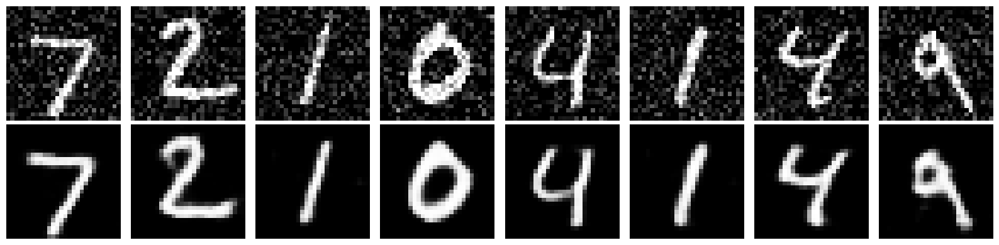

In [ ]:
'''
ref1:https://towardsdatascience.com/autoencoders-in-keras-c1f57b9a2fd7
ref2:
https://medium.com/analytics-vidhya/building-a-convolutional-autoencoder-using-keras-using-conv2dtranspose-ca403c8d144e
'''
import tensorflow as tf
from tensorflow.keras.datasets import mnist
from tensorflow.keras.layers import Input, Dense,  Flatten, Reshape, BatchNormalization
from tensorflow.keras.layers import Conv2D, MaxPool2D, Conv2DTranspose, UpSampling2D

import numpy as np
import matplotlib.pyplot as plt

#1: 
gpus = tf.config.experimental.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(gpus[0], True)

#2:
(x_train, y_train), (x_test, y_test) = mnist.load_data()
x_train = x_train.astype('float32')/255
x_test  = x_test.astype('float32')/255

# expand data with channel = 1
x_train = np.expand_dims(x_train,axis = 3)     # (60000, 28, 28, 1)
x_test = np.expand_dims(x_test, axis = 3)      # (10000, 28, 28, 1)

#3: add noise to dataset
x_train_noise = x_train + np.random.normal(loc=0.0, scale=0.2, size=x_train.shape)
x_test_noise  = x_test  + np.random.normal(loc=0.0, scale=0.2, size=x_test.shape)
x_train_noise = np.clip(x_train_noise, 0, 1)
x_test_noise = np.clip(x_test_noise, 0, 1)

#4: autoencoder model
#4-1:
encode_dim = 32  # latent_dim
input_x= Input(shape = x_train.shape[1:]) #  (28, 28, 1)
encode= Conv2D(filters=32,kernel_size=(3,3), padding='same', activation = 'relu')(input_x)
encode= MaxPool2D()(encode) # (14, 14, 32)

encode= Conv2D(filters= 16, kernel_size= (3, 3), padding='same', activation = 'relu')(encode)
encode= MaxPool2D()(encode) # (7, 7, 16)
encode= Flatten()(encode)

encode= Dense(units = encode_dim, activation = 'relu')(encode)
encoder = tf.keras.Model(inputs= input_x, outputs= encode, name ='encoder')
encoder.summary()

#4-2: decoder by (Conv2D + UpSampling2D) or Conv2DTranspose
decode_input = Input(shape = (encode_dim,))
encode= Dense(units = 7*7*4, activation = 'relu')(decode_input)
decode= Reshape((7, 7, 4))(encode)

##decode=Conv2D(filters=16, kernel_size = (3, 3), strides = (1, 1), 
##                 activation = 'relu', padding = 'same')(decode)
##decode=UpSampling2D()(decode) # size =(2,2)
decode=Conv2DTranspose(filters=16, kernel_size = (3, 3), strides = (2, 2), 
                           activation = 'relu', padding = 'same')(decode)

##decode=Conv2D(filters=32, kernel_size = (3, 3), strides = (1, 1), 
##                 activation = 'relu', padding = 'same')(decode)
##decode=UpSampling2D()(decode)
decode=Conv2DTranspose(filters=32, kernel_size = (3, 3), strides = (2, 2), 
                           activation = 'relu', padding = 'same')(decode)

decode=Conv2D(filters=1, kernel_size = (3, 3), strides = (1, 1), 
              activation = 'sigmoid', padding = 'same')(decode)
decoder = tf.keras.Model(inputs= decode_input, outputs= decode, name ='decoder')
decoder.summary()

#4-3
autoencoder  = tf.keras.Model(inputs = input_x,
                            outputs = decoder(encoder(input_x)), name ='autoencoder')
autoencoder.summary()
 
#5: train the model
opt = tf.keras.optimizers.RMSprop(learning_rate = 0.001) #'rmsprop'
autoencoder.compile(optimizer = opt, loss= 'mse' ) #  'binary_crossentropy'
ret = autoencoder.fit(x=x_train_noise, y=x_train, epochs= 100, batch_size= 128,
                       validation_split = 0.2, verbose = 2) 

#6:
##fig, ax = plt.subplots(1, 2, figsize = (10, 6))
##ax[0].plot(ret.history['loss'], "b-")
##ax[0].set_title("train loss")
##ax[0].set_xlabel('epochs')
##ax[0].set_ylabel('loss')
##
##ax[1].plot(ret.history['val_loss'], "g-")
##ax[1].set_title("val loss")
##ax[1].set_xlabel('epochs')
##ax[1].set_ylabel('loss')
##fig.tight_layout()
##plt.show()

#7: apply  x_test_noise[:8] to model and display
F = encoder(x_test_noise[:8])
print("F.shape=", F.shape)

img = decoder(F)  # img = autoencoder(x_test_noise[:8])
img = img.numpy()
img = img.reshape(-1, 28, 28)
print("img.shape=", img.shape)
 
#8: display images
fig = plt.figure(figsize = (16, 4))
for i in range(16):   
    plt.subplot(2, 8, i + 1)
    if i<8: # noise
        plt.imshow(x_test_noise[i,:,:,0], cmap = 'gray')
    else:   # reconstructed
        plt.imshow(img[i-8], cmap = 'gray')
    plt.axis("off")

fig.tight_layout()
plt.show()